# Hands-on Image Processing with Python
## Chapter 2: Sampling & Fourier Transform 

## Author: Sandipan Dey

### In this chapter, we'll discuss 2D signals in the time and frequency domains. We'll first talk about spatial sampling, an important concept that is used in resizing an image, and about the challenges in sampling. We'll try solving these problems using the functions in the Python library. We'll also introduce intensity quantization in an image; intensity quantizing means how many bits will be used to store a pixel in an image and what impact it will have on the quality of the image. You will surely want to know about the Discrete Fourier Transform (DFT) that can be used to transform an image from the spatial (time) domain into the frequency domain. You'll learn to implement DFT with the Fast Fourier Transform (FFT) algorithm using numpy and scipy functions and will be able to apply this implementation on an image!

### You will also be interested in knowing about __**2D convolutions**__ that increase the speed of convolution. We'll also understand the basic concepts of the convolution theorem. We'll try and clear up the age-old confusion between correlation and convolution using an example. Moreover, we'll describe an example from SciPy that will show you how to find the location of specific patterns in an image using a template by applying cross-correlation.

### We'll also be covering a few filtering techniques and will understand how to implement them with Python libraries. You'll be interested to see the results that we'll obtain after denoising an image using these filters.

### The topics that we'll be covering in this chapter are as follows:
-       Image formation – Sampling and quantization 
-       Discrete Fourier Transform
-       Understanding convolution

# Image formation – sampling and quantization
### In this section, we'll describe two important concepts for image formation, namely, sampling and quantization, and see how we can resize an image with sampling and colors quantized with PIL and scikit-image libraries. We'll use a hands-on approach here and we'll define the concepts while seeing them in action. Ready?
### Let's start by importing all of the required packages:

### Import libraries

In [9]:
% matplotlib inline 
from PIL import Image
from skimage.io import imread, imshow, show
import scipy.fftpack as fp
from scipy import ndimage, misc, signal
from scipy.stats import signaltonoise
from skimage import data, img_as_float
#import skimage as ski, package, class, object, attribute - (), 
from skimage.color import rgb2gray
from skimage.transform import rescale
import matplotlib.pylab as pylab
import numpy as np
import numpy.fft
import timeit

# Sampling
    Sampling refers to the selection/rejection of image pixels, which means that it is a spatial operation. We can use sampling to increase or reduce the size of an image, with up-sampling and down-sampling, respectively. In the next few sections, we'll discuss different sampling techniques with examples.

### Up-Sampling
    As discussed briefly in Chapter 1, Getting Started with Image Processing, in order to increase the size of an image we need to up-sample the image. The challenge is that the new larger images will have some pixels that have no corresponding pixel in the original smaller image, and we need to guess those unknown pixel values. We can guess the value of an unknown pixel using the following:
    An aggregate, for example, the mean value of its nearest known one or more pixel-neighbors values
    An interpolated value using pixel-neighbors with bi-linear or cubic interpolation 

In [2]:
im  #variable im is not yet born; space 

NameError: name 'im' is not defined

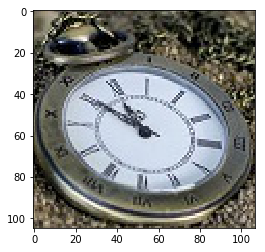

(<matplotlib.image.AxesImage at 0x7fe6cb897860>, None)

In [7]:
#Nearest neighbor-based up-sampling may result in a poor quality output image. Let's code to verify this: 
im = Image.open("../images/clock.jpg") # the original small clock image
pylab.imshow(im), pylab.show()

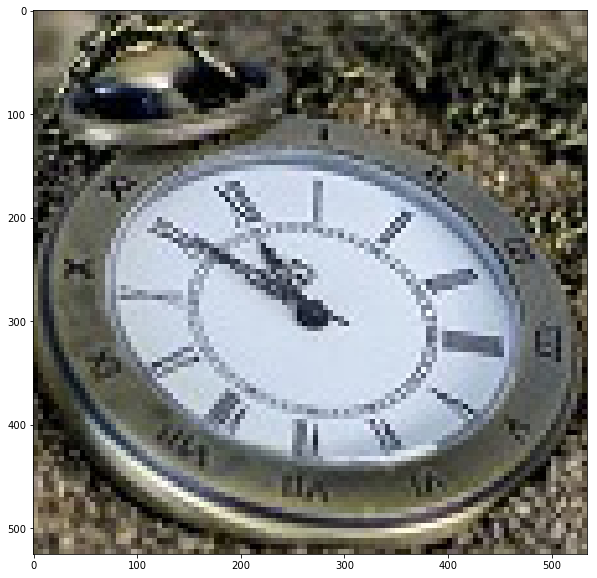

(<matplotlib.figure.Figure at 0x7f17055b0b70>,
 None)

In [16]:
#Let's now increase the width and height of the original image to a factor of five 
#(thereby increasing the image size 25 times):

im1 = im.resize((im.width*5, im.height*5), Image.NEAREST) # nearest neighbor interpolation
#im1 = im.resize((im.width*5, im.height*5), Image.BILINEAR)
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

# Here's the output of the nearest neighbor up-sampling, which does not work well; 
# we obtain a larger pixelated image:

As we can see, the output image, created with the nearest-neighbor method, is 25 times larger than the input image, using the PIL library's resize() function. But clearly the output image is pixelated (with the blocking artifacts and jagged edges) and is of poor quality. 

##  Up-sampling and interpolation (see textbooks)

### Bi-linear interpolation
    Notice how the quality improves when bi-linear interpolation is used with up-sampling.
### Bi-cubic interpolation
    smoother than corresponding surfaces obtained by bi-linear interpolation
    be accomplished using either Lagrange polynomials, cubic splines, or the cubic convolution algorithm. 
    PIL uses cubic spline interpolation in a 4 x 4 environment.
    

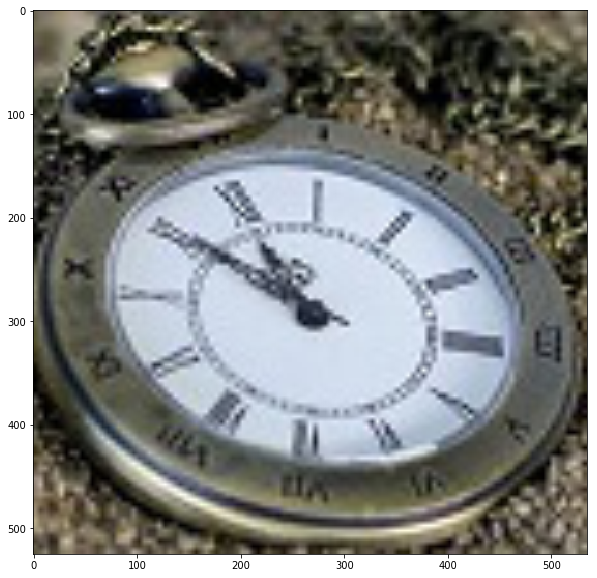

(<matplotlib.figure.Figure at 0x1b7f2bc2c50>,
 None)

In [7]:
im1 = im.resize((im.width*5, im.height*5), Image.BILINEAR) # up-sample with bi-linear interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

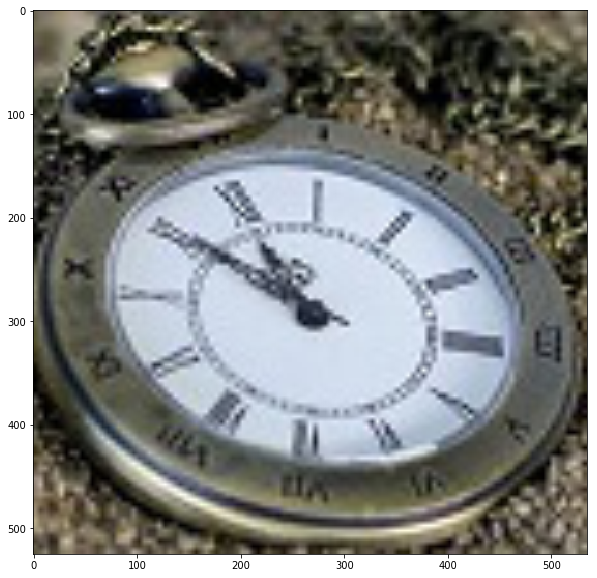

(<matplotlib.figure.Figure at 0x1b7f2c05fd0>,
 None)

In [8]:
im.resize((im.width*10, im.height*10), Image.BICUBIC).show() # bi-cubic interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

#Look at how the quality of the resized image improves when we use bi-cubic interpolation

## Down-sampling
    In order to decrease the size of an image, we need to down-sample the image. For each pixel in the new smaller image, there will be multiple pixels in the original larger image.
    We can compute the value of a pixel in the new image by doing the following:
    
    Dropping some pixels (for example, dropping every other row and column if we want an image a fourth of the size of the original image) from the larger image in a systematic way
    
    Computing the new pixel value as an aggregate value of the corresponding multiple pixels in the original image


In [9]:
im = Image.open("../images/tajmahal.jpg")
im.show()

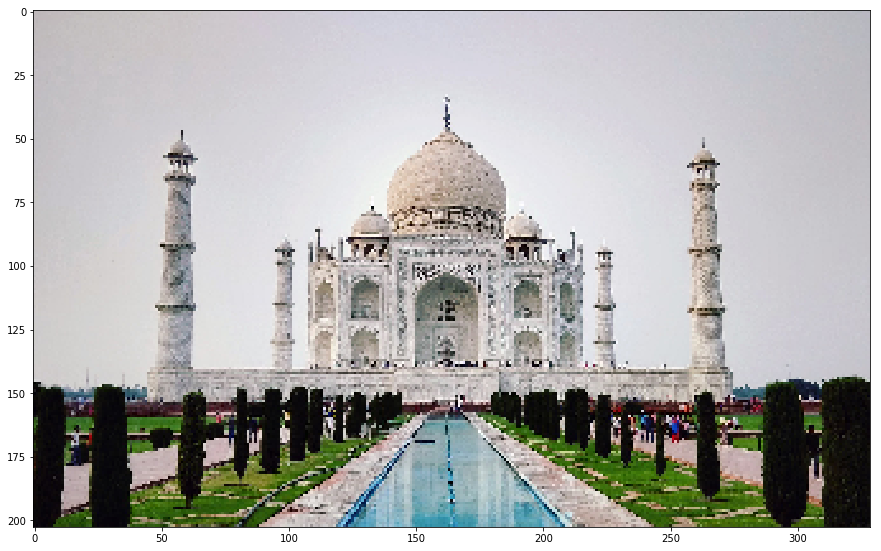

(<matplotlib.figure.Figure at 0x1b7f2a4bc18>,
 None)

In [10]:
im = im.resize((im.width//5, im.height//5))
# by choosing every row in five rows and every column in five columns from the input image
pylab.figure(figsize=(15,10)), pylab.imshow(im), pylab.show()
#it contains some black patches/artifacts and patterns that were not present in the original image
#—this effect is called aliasing.

##### Aliasing happens typically because the sampling rate is lower (we had too few pixels!) than the Nyquist rate (so one way to avoid aliasing is to increase the sampling rate above the Nyquist rate, but what if we want an output image of a smaller size?).

# Down-sampling and anti-aliasing
##### As we have seen, down-sampling is not very good for shrinking images as it creates an aliasing effect. For instance, if we try to resize (down-sample) the original image by reducing the width and height a factor of 5, we shall get such patchy and bad output.
### Anti-aliasing
#### The problem here is that a single pixel in the output image corresponds to 25 pixels in the input image, but we are sampling the value of a single pixel instead. We should be averaging over a small area in the input image. This can be done using ANTIALIAS (a high-quality down-sampling filter); this is how you can do it:
#### Anti-aliasing is generally done by smoothing an image (via convolution of the image with a low-pass filter such as a Gaussian filter) before down-sampling. 


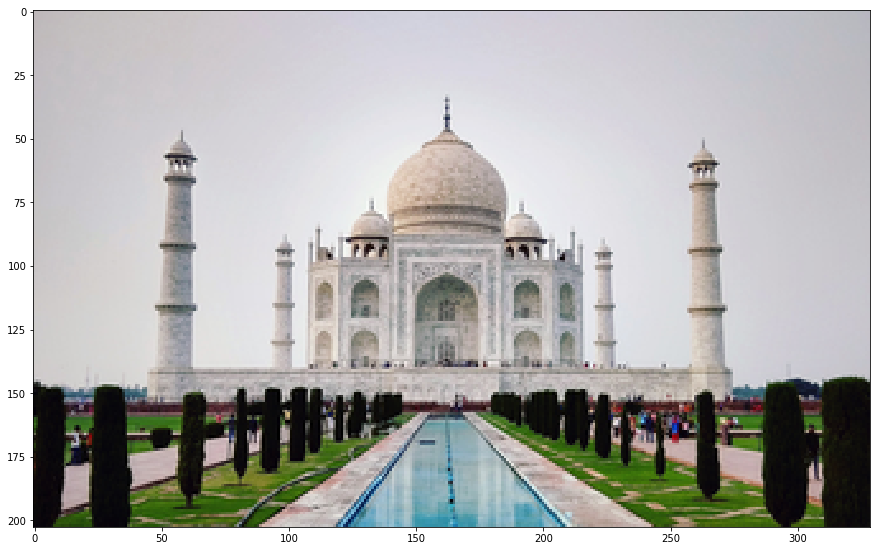

(<matplotlib.figure.Figure at 0x1b7ef904160>,
 None)

In [11]:
im = Image.open("../images/tajmahal.jpg")
#im = im.resize((im.width//5, im.height//5))
im = im.resize((im.width//5, im.height//5), Image.ANTIALIAS)
pylab.figure(figsize=(15,10)), pylab.imshow(im), pylab.show()

#### Let's now use the scikit-image transform module's rescale() function with anti-aliasing to overcome the aliasing problem for another image, namely the umbc.png image: 

TypeError: rescale() got an unexpected keyword argument 'multichannel'

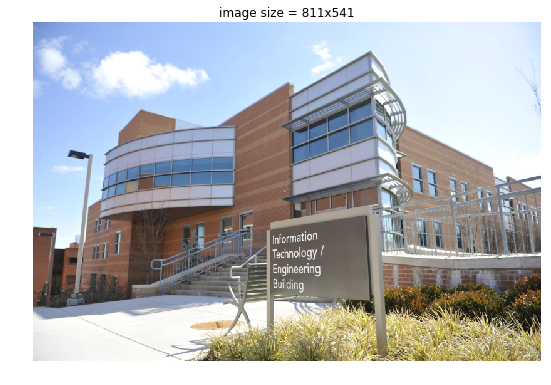

In [10]:
im = imread('../images/umbc.png')
im1 = im.copy()
pylab.figure(figsize=(20,15))
for i in range(4):
    pylab.subplot(2,2,i+1), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
    pylab.title('image size = ' + str(im1.shape[1]) + 'x' + str(im1.shape[0]))
    im1 = rescale(im1, scale = 0.5, multichannel=True, anti_aliasing=False)  
    # Let's change the line of code to use anti-aliasing as True
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

In [15]:
im1 = rescale(im1, scale = 0.5, multichannel=True, anti_aliasing=True)

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\skimage\transform\_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


## Quantizing
#### Quantization is related to the intensity of an image and can be defined by the number of bits used per pixel. Digital images typically are quantized to 256 gray levels. Here, we will see that, as the number of bits for pixel storage decreases, the quantization error increases, leading to artificial boundaries or contours and pixelating and resulting in the poor quality of an image.

### Quantizing with PIL

In [13]:
im = Image.open('../images/parrot.jpg')
pylab.figure(figsize=(20,30))
num_colors_list = [1 << n for n in range(8,0,-1)]
num_colors_list

[256, 128, 64, 32, 16, 8, 4, 2]

/home/conda/anaconda3-4.4.0/lib/python3.6/site-packages/ipykernel_launcher.py:9: DeprecationWarning: `signaltonoise` is deprecated!
scipy.stats.signaltonoise is deprecated in scipy 0.16.0
  if __name__ == '__main__':


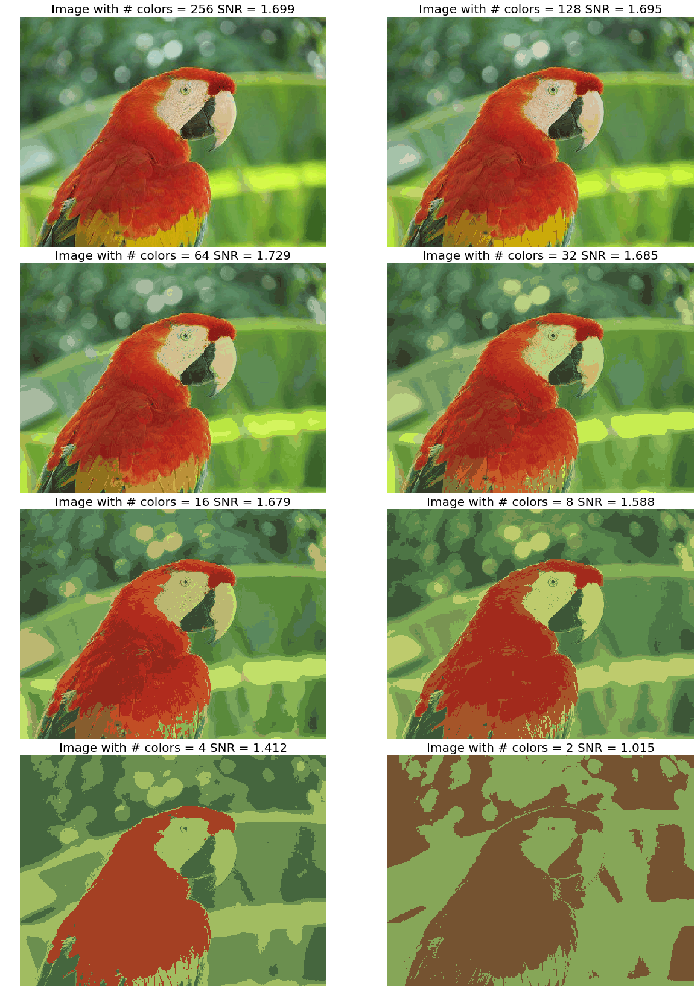

In [11]:
snr_list = []
i = 1
for num_colors in num_colors_list:
    im1 = im.convert('P', palette=Image.ADAPTIVE, colors=num_colors)
    pylab.subplot(4,2,i), pylab.imshow(im1), pylab.axis('off')
    snr_list.append(signaltonoise(im1, axis=None))
    pylab.title('Image with # colors = ' + str(num_colors) + ' SNR = ' +
    str(np.round(snr_list[i-1],3)), size=20)
    i += 1
pylab.subplots_adjust(wspace=0.2, hspace=0)
pylab.show()

# This shows how the image quality decreases with color-quantization, as the number of bits to store a pixel reduces:

#### We'll now plot the impact of color-quantization on the SNR of the image, which is typically a measure for image quality—the higher the SNR, the better the quality:

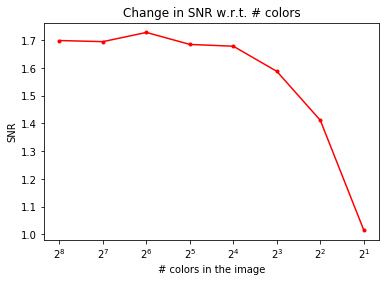

In [20]:
pylab.plot(num_colors_list, snr_list, 'r.-')
pylab.xlabel('# colors in the image')
pylab.ylabel('SNR')
pylab.title('Change in SNR w.r.t. # colors')
pylab.xscale('log', basex=2)
pylab.gca().invert_xaxis()
pylab.show()

#### As can be seen, although the color-quantization reduces image size (since the number of bits/pixel gets reduced), it also makes the quality of the image poorer, measured by the SNR:

## Discrete Fourier Transform
### The Fourier transform method has a long mathematical history and we are not going to discuss it here (it can be found in any digital signal processing or digital image processing theory book). As far as image processing is concerned, we shall focus only on 2D Discrete Fourier Transform (DFT). The basic idea behind the Fourier transform method is that an image can be thought of as a 2D function, f, that can be expressed as a weighted sum of sines and cosines (Fourier basic functions) along two dimensions.

### We can transition from a set of grayscale pixel values in the image (spatial/time domain) to a set of Fourier coefficients (frequency domain) using the DFT, and it is discrete since the spatial and the transform variables to be used can only take a set of discrete consecutive integer values (typically the locations of a 2D array representing the image).

### In a similar way, the frequency domain 2D array of Fourier coefficients can be converted back into the spatial domain using the Inverse Discrete Fourier Transform (IDFT), which is also known as reconstruction of the image using the Fourier coefficients. The DFT and IDFT are mathematically defined as follows:

### See equations shown on textbook


## Why do we need the DFT?

### First of all, transformation to the frequency domain leads to a better understanding of an image. As we'll see in the next few sections, the low frequencies in the frequency domain correspond to the average gross level of information in an image, whereas the higher frequencies correspond to edges, noise, and more detailed information.

### Typically, images by nature are smooth and that is why most images can be represented using a handful of DFT coefficients and all of the remaining higher coefficients tend to be almost negligible/zeros.

### This is is very useful in image compression, particularly for Fourier-sparse images, where only a handful of Fourier coefficients are required to reconstruct an image, hence only those frequencies can be stored and others can be discarded, leading to high compression (for example, in the JPEG image compression algorithm a similar transformation, Discrete Cosine Transform (DCT) is used. Also, as we shall see later in this chapter, filtering with the DFT in the frequency domain can be much faster than filtering in the spatial domain. 

## The Fast Fourier Transform algorithm to compute the DFT

### The Fast Fourier Transform (FFT) is a divide and conquer algorithm to recursively compute the DFT much quicker (with O (N.log2N) time complexity) than the much slower O (N2) naive computation for an n x n image. In Python, both the numpy and scipy libraries provide functions to compute 2D DFT/IDFT using the FFT algorithm. Let's see a few examples.


### FFT with the scipy.fftpack module
#### We'll use the scipy.fftpack module's fft2()/ifft2() function to compute the DFT/IDFT with the FFT algorithm using a grayscale image, rhino.jpg:

/home/conda/anaconda3-4.4.0/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: `signaltonoise` is deprecated!
scipy.stats.signaltonoise is deprecated in scipy 0.16.0
  


SNR for the original image = 2.023722773801701
SNR for the image obtained after reconstruction = 2.023722773801701


/home/conda/anaconda3-4.4.0/lib/python3.6/site-packages/ipykernel_launcher.py:8: DeprecationWarning: `signaltonoise` is deprecated!
scipy.stats.signaltonoise is deprecated in scipy 0.16.0
  


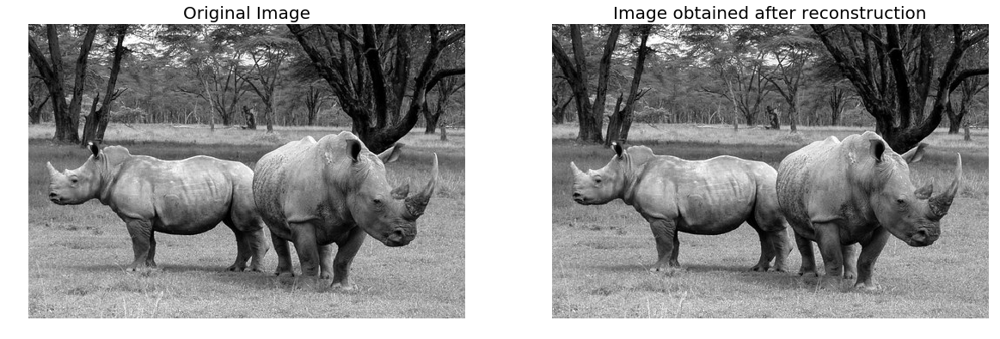

In [14]:
im = np.array(Image.open('../images/rhino.jpg').convert('L')) # we shall work with grayscale image
snr = signaltonoise(im, axis=None)
print('SNR for the original image = ' + str(snr))
# SNR for the original image = 2.023722773801701
# now call FFT and IFFT
freq = fp.fft2(im)
im1 = fp.ifft2(freq).real
snr = signaltonoise(im1, axis=None)
print('SNR for the image obtained after reconstruction = ' + str(snr))
# SNR for the image obtained after reconstruction = 2.0237227738013224
assert(np.allclose(im, im1)) # make sure the forward and inverse FFT are close to each other
pylab.figure(figsize=(20,10))
pylab.subplot(121), pylab.imshow(im, cmap='gray'), pylab.axis('off')
pylab.title('Original Image', size=20)
pylab.subplot(122), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
pylab.title('Image obtained after reconstruction', size=20)
pylab.show()

### As can be seen from the SNR values from the inline output and from the visual difference in the input and the reconstructed image, the reconstructed image loses some information. The difference is negligible if we use all of the coefficients obtained for reconstruction

### Plotting the frequency spectrum

#### As Fourier coefficients are complex numbers, we can view magnitudes directly. Displaying magnitudes of Fourier transforms is called the spectrum of the transform. The value F [0,0] of the DFT is called the DC coefficient.

#### The DC coefficient is too large for the other coefficient values to be seen, which is why we need to stretch the transform values by displaying the logarithm of the transform. Also, for display convenience, the transform coefficients are shifted (with fftshift()) so that the DC component is in the center. Excited to create a Fourier spectrum of the rhino image? Code this:

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\ipykernel_launcher.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  This is separate from the ipykernel package so we can avoid doing imports until


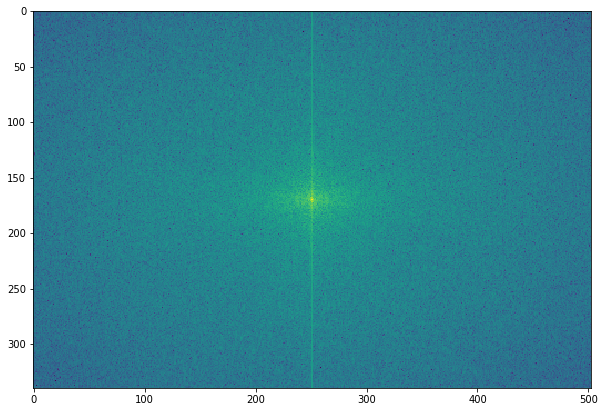

(<matplotlib.figure.Figure at 0x1b7f4bf3898>,
 None)

In [25]:
# the quadrants are needed to be shifted around in order that the low spatial frequencies are in the center of the 2D fourier-transformed image.
freq2 = fp.fftshift(freq)
pylab.figure(figsize=(10,10)), pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int)), pylab.show()

### Are you surprised? This is what the rhino image looks like, in its Fourier spectrum form:

# FFT with the numpy.fft module
### The DFT of an image can be computed with the numpy.fft module's similar set of functions. We'll see some examples.

## Computing the magnitude and phase of a DFT

### We'll use the house.png image as input and thus fft2() to get the real and imaginary components of the Fourier coefficients; after that, we'll compute the magnitude/spectrum and the phase and, finally, use ifft2() to reconstruct the image:

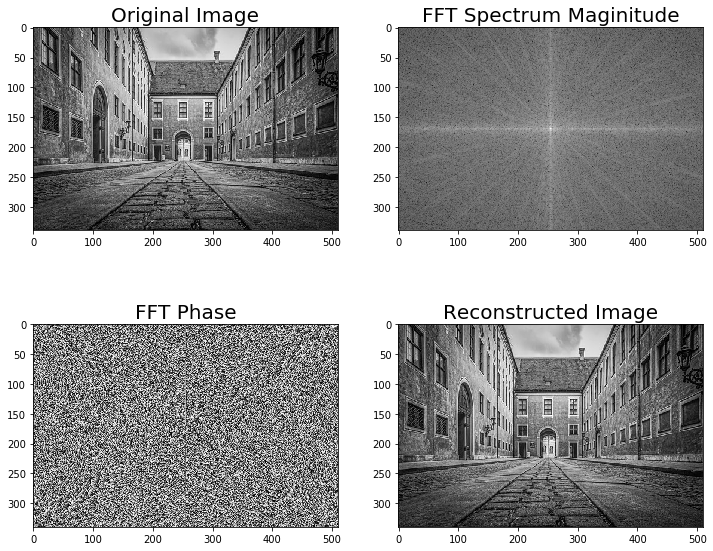

In [29]:
import numpy.fft as fp
im1 = rgb2gray(imread('../images/house.png'))
pylab.figure(figsize=(12,10))
freq1 = fp.fft2(im1)
im1_ = fp.ifft2(freq1).real
pylab.subplot(2,2,1), pylab.imshow(im1, cmap='gray'), pylab.title('Original Image', size=20)
pylab.subplot(2,2,2), pylab.imshow(20*np.log10( 0.01 +
np.abs(fp.fftshift(freq1))), cmap='gray')
pylab.title('FFT Spectrum Maginitude', size=20)
pylab.subplot(2,2,3), pylab.imshow(np.angle(fp.fftshift(freq1)),cmap='gray')
pylab.title('FFT Phase', size=20)
pylab.subplot(2,2,4), pylab.imshow(np.clip(im1_,0,255), cmap='gray')
pylab.title('Reconstructed Image', size=20)
pylab.show()

### As can be seen, the magnitude  generally decreases with higher spatial frequencies and the FFT phase appears to be less informative.

### Let's now compute the spectrum/magnitude, phase, and reconstructed image with another input image, house2.png:

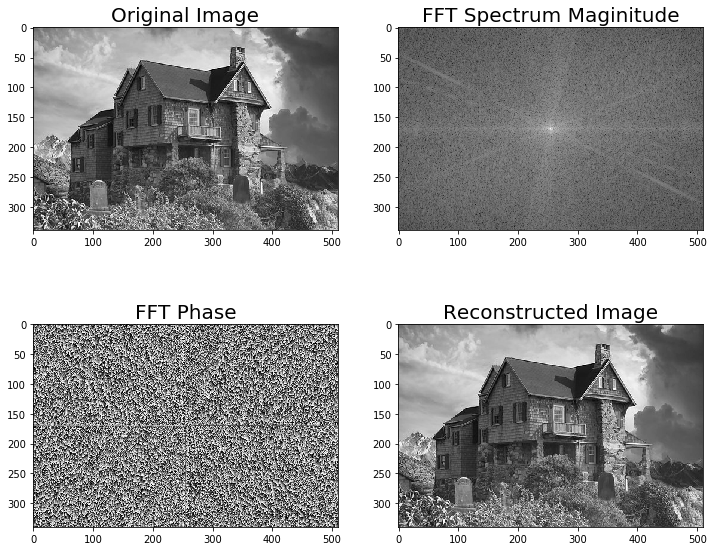

In [32]:
im2 = rgb2gray(imread('../images/house2.png'))
pylab.figure(figsize=(12,10))
freq2 = fp.fft2(im2)
im2_ = fp.ifft2(freq2).real
pylab.subplot(2,2,1), pylab.imshow(im2, cmap='gray'), pylab.title('Original Image', size=20)
pylab.subplot(2,2,2), pylab.imshow(20*np.log10( 0.01 +
np.abs(fp.fftshift(freq2))), cmap='gray')
pylab.title('FFT Spectrum Maginitude', size=20)
pylab.subplot(2,2,3), pylab.imshow(np.angle(fp.fftshift(freq2)), cmap='gray')
pylab.title('FFT Phase', size=20)
pylab.subplot(2,2,4), pylab.imshow(np.clip(im2_,0,255), cmap='gray')
pylab.title('Reconstructed Image', size=20)
pylab.show()

### Although it's not as informative as the magnitude, the DFT phase is also important information and an image can't be reconstructed properly if the phase is not available or if we use a different phase array.

### To witness this, let's see how a reconstructed output image gets distorted if we use the real components of the frequency spectrum from one image and imaginary components from another one:

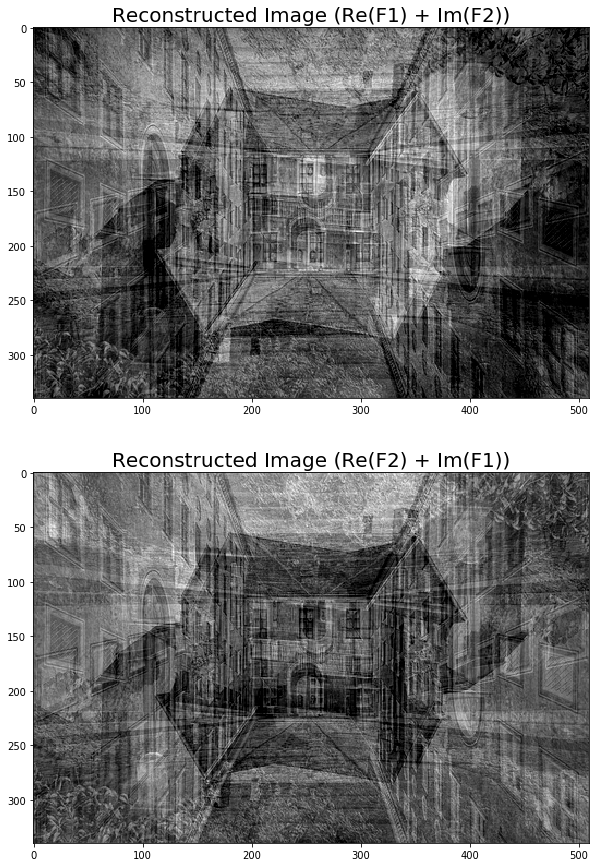

In [33]:
pylab.figure(figsize=(20,15))
im1_ = fp.ifft2(np.vectorize(complex)(freq1.real, freq2.imag)).real
im2_ = fp.ifft2(np.vectorize(complex)(freq2.real, freq1.imag)).real
pylab.subplot(211), pylab.imshow(np.clip(im1_,0,255), cmap='gray')
pylab.title('Reconstructed Image (Re(F1) + Im(F2))', size=20)
pylab.subplot(212), pylab.imshow(np.clip(im2_,0,255), cmap='gray')
pylab.title('Reconstructed Image (Re(F2) + Im(F1))', size=20)
pylab.show()

# Understanding convolution
###   Convolution is an operation that operates on two images, one being an input image and the other one being a mask (also called the kernel) as a filter on the input image, producing an output image. 
###  Convolution filtering is used to modify the spatial frequency characteristics of an image. It works by determining the value of a central pixel by adding the weighted values of all of its neighbors together to compute the new value of the pixel in the output image. The pixel values in the output image are computed by traversing the kernel window through the input image, as shown in the next screenshot (for convolution with the valid mode; we'll see convolution modes later in this chapter):

### see graphics on textbook

### As you can see, the kernel window, marked by an arrow in the input image, traverses through the image and obtains values that are mapped on the output image after convolving.

## Why convolve an image?
### Convolution applies a general-purpose filter effect on the input image. This is done in order to achieve various effects with appropriate kernels on an image, such as smoothing, sharpening, and embossing, and in operations such as edge detection.

## Convolution with SciPy signal's convolve2d
### The SciPy signal module's convolve2d() function can be used for correlation. We are going to apply convolution on an image with a kernel using this function.

### Applying convolution to a grayscale image
#### Let's first detect edges from a grayscale cameraman.jpg image using convolution with the Laplace kernel and also blur an image using the box kernel:

0.992156862745
(256, 256)


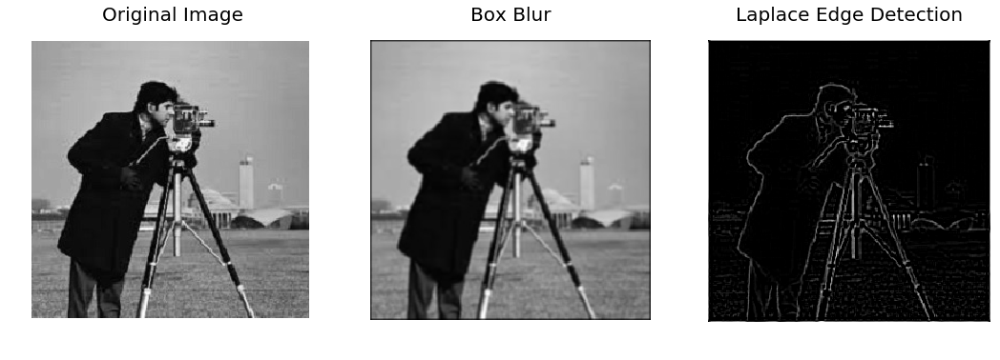

In [18]:
im = rgb2gray(imread('../images/cameraman.jpg')).astype(float)
print(np.max(im))
print(im.shape)
blur_box_kernel = np.ones((3,3)) / 9
edge_laplace_kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]])
im_blurred = signal.convolve2d(im, blur_box_kernel)
im_edges = np.clip(signal.convolve2d(im_blurred, edge_laplace_kernel), 0, 1)
#im_edges = np.clip(signal.convolve2d(im, edge_laplace_kernel), 0, 1)
#fig, axes = pylab.subplots(ncols=3, sharex=True, sharey=True, figsize=(18,6))
fig, axes = pylab.subplots(ncols=3, sharex=True, sharey=True, figsize=(18,6))
axes[0].imshow(im, cmap=pylab.cm.gray)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_blurred, cmap=pylab.cm.gray)
axes[1].set_title('Box Blur', size=20)
axes[2].imshow(im_edges, cmap=pylab.cm.gray)
axes[2].set_title('Laplace Edge Detection', size=20)
for ax in axes:
    ax.axis('off')
pylab.show()

### Here is the output—the original cameraman image along with the ones created after convolving with the box blur and Laplace kernel, which we obtained using the scipy.signal module's convolve2d() function:

## Convolution modes, pad values, and boundary conditions

###  Depending on what you want to do with the edge pixels, there are three arguments: mode, boundary, and fillvalue, which can be passed to the SciPy convolve2d() function. Here, we'll briefly discuss the mode argument:

#### mode='full': This is the default mode, in which the output is the full discrete linear convolution of the input. 
#### mode='valid': This ignores edge pixels and only computes for those pixels with all neighbors (pixels that do not need zero-padding). The output image size is less than the input image size for all kernels (except 1 x 1). 
#### mode='same': The output image has the same size as the input image; it is centered with regards to the 'full' output.

### Applying convolution to a color (RGB) image

#### With scipy.convolve2d(), we can sharpen an RGB image as well. We have to apply the convolution separately for each image channel.

#### Let's use the tajmahal.jpg image, with the emboss kernel and the schar edge detection complex kernel:

1.0
(1018, 1645, 3)


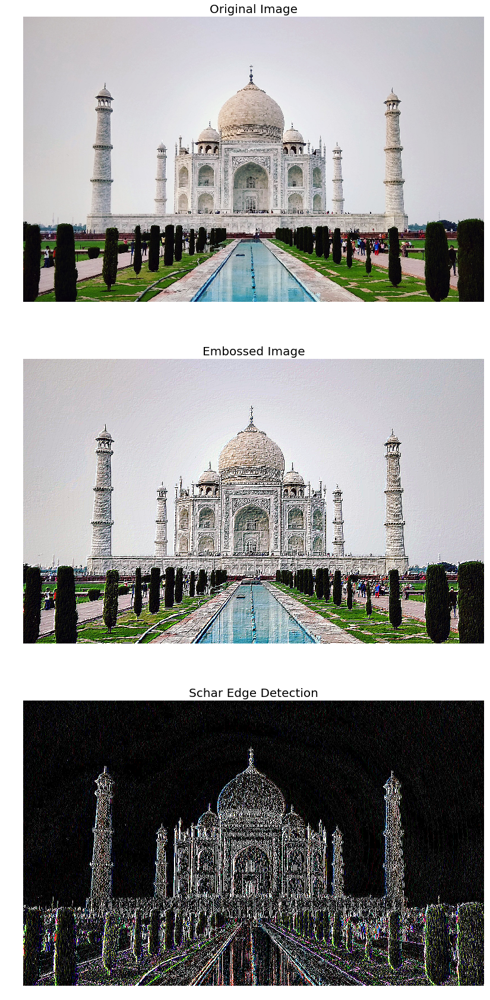

In [46]:
im = misc.imread('../images/tajmahal.jpg')/255 # scale each pixel value in [0,1]
print(np.max(im))
print(im.shape)
emboss_kernel = np.array([[-2,-1,0],[-1,1,1],[0,1,2]])
edge_schar_kernel = np.array([[ -3-3j, 0-10j, +3 -3j], [-10+0j, 0+ 0j, +10+0j], [ -3+3j, 0+10j, +3 +3j]])
im_embossed = np.ones(im.shape)
im_edges = np.ones(im.shape)
for i in range(3):
    im_embossed[...,i] = np.clip(signal.convolve2d(im[...,i], emboss_kernel, mode='same', boundary="symm"),0,1)
for i in range(3):
    im_edges[:,:,i] = np.clip(np.real(signal.convolve2d(im[...,i], edge_schar_kernel, mode='same', boundary="symm")),0,1)
fig, axes = pylab.subplots(nrows=3, figsize=(20, 30))
axes[0].imshow(im)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_embossed)
axes[1].set_title('Embossed Image', size=20)
axes[2].imshow(im_edges)
axes[2].set_title('Schar Edge Detection', size=20)
for ax in axes:
    ax.axis('off')
pylab.show()

## Convolution with SciPy ndimage.convolve

### With scipy.ndimage.convolve(), we can sharpen an RGB image directly (we do not have to apply the convolution separately for each image channel).

###  the victoria_memorial.png image with the sharpen kernel and the emboss kernel:

255.0


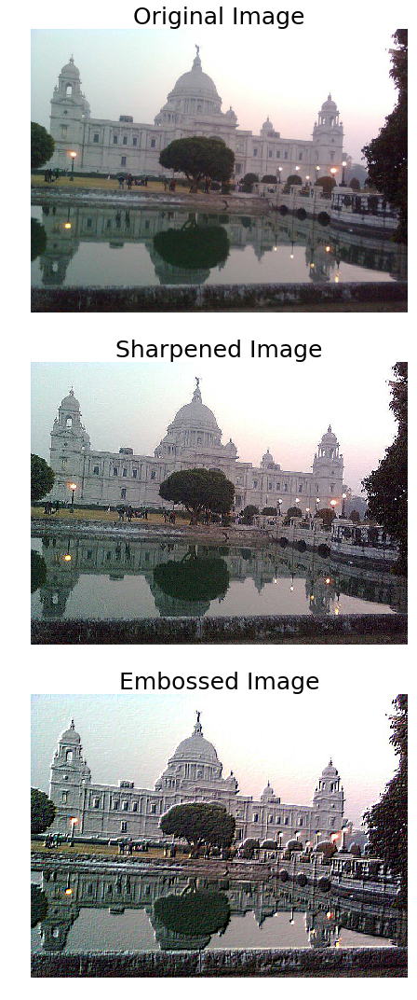

In [52]:
im = misc.imread('../images/victoria_memorial.png').astype(np.float) # read as float
print(np.max(im))
sharpen_kernel = np.array([0, -1, 0, -1, 5, -1, 0, -1, 0]).reshape((3, 3, 1))
emboss_kernel = np.array(np.array([[-2,-1,0],[-1,1,1],[0,1,2]])).reshape((3, 3, 1))
im_sharp = ndimage.convolve(im, sharpen_kernel, mode='nearest')
im_sharp = np.clip(im_sharp, 0, 255).astype(np.uint8) # clip (0 to 255) and convert to unsigned int
im_emboss = ndimage.convolve(im, emboss_kernel, mode='nearest')
im_emboss = np.clip(im_emboss, 0, 255).astype(np.uint8)
pylab.figure(figsize=(10,15))
pylab.subplot(311), pylab.imshow(im.astype(np.uint8)), pylab.axis('off')
pylab.title('Original Image', size=25)
pylab.subplot(312), pylab.imshow(im_sharp), pylab.axis('off')
pylab.title('Sharpened Image', size=25)
pylab.subplot(313), pylab.imshow(im_emboss), pylab.axis('off')
pylab.title('Embossed Image', size=25)
pylab.tight_layout()
pylab.show()

##  Correlation versus convolution                                                        

### Correlation is very similar to the convolution operation in the sense that it also takes an input image and another kernel and traverses the kernel window through the input by computing a weighted combination of pixel neighborhood values with the kernel values and producing the output image.

### The only difference is that, unlike correlation, convolution flips the kernel twice (with regards to the horizontal and vertical axis) before computing the weighted combination.

### The next diagram mathematically describes the difference between correlation and convolution on an image:

#    [reference textbook for detail]

## Template matching with cross-correlation between the image and template

### In this example, we'll use cross-correlation with the eye template image (using a kernel with the image for cross-correlation) and the location of the eye in the raccoon-face image can be found as follows:

### You have marked the location with the largest cross-correlation value (the best match with the template) with a red dot:

C:\Users\Sandipan.Dey\Anaconda\envs\ana41py35\lib\site-packages\matplotlib\figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


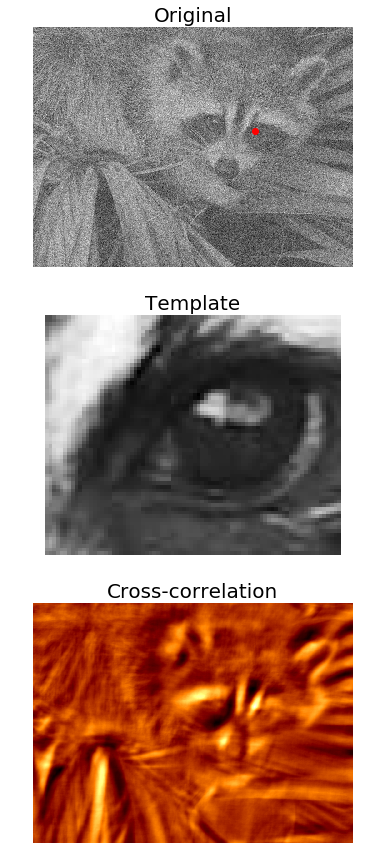

In [53]:
face_image = misc.face(gray=True) - misc.face(gray=True).mean()
template_image = np.copy(face_image[300:365, 670:750]) # right eye
template_image -= template_image.mean()
face_image = face_image + np.random.randn(*face_image.shape) * 50 # add random noise
correlation = signal.correlate2d(face_image, template_image, boundary='symm', mode='same')
y, x = np.unravel_index(np.argmax(correlation), correlation.shape) # find the match
fig, (ax_original, ax_template, ax_correlation) = pylab.subplots(3, 1, figsize=(6, 15))
ax_original.imshow(face_image, cmap='gray')
ax_original.set_title('Original', size=20)
ax_original.set_axis_off()
ax_template.imshow(template_image, cmap='gray')
ax_template.set_title('Template', size=20)
ax_template.set_axis_off()
ax_correlation.imshow(correlation, cmap='afmhot')
ax_correlation.set_title('Cross-correlation', size=20)
ax_correlation.set_axis_off()
ax_original.plot(x, y, 'ro')
fig.show()

# Summary                                                        
###    We discussed a few important concepts primarily related to 2D DFT and its related applications in image processing, such as filtering in the frequency domain, and we worked on quite a few examples using scikit-image numpy.fft, scipy.fftpack, signal, and ndimage modules.Hopefully, you are now clear on sampling and quantization, the two important image formation techniques. We have seen 2D DFT, Python implementations of FFT algorithms, and applications such as image denoising and restoration, correlation and convolution of the DFT in image processing, and application of convolution with an appropriate kernel in filter design and the application of correlation in template matching.You should now be able to write Python code to do sampling and quantization using PIL/SciPy/sckit-image libraries and to perform 2D FT/IFT in Python using the FFT algorithm. We saw how easy it was to do basic 2D convolutions on images with some kernels.In the next chapter, we'll discuss more on convolution and explore its wide range of applications. We'll also learn about frequency domain filtering, along with various frequency domain filters.